In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
import os
import shutil
import random

# Define dataset paths
dataset_path = "/content/drive/MyDrive/AI_535_final_project/plantvillagedataset/color"
train_path = os.path.join(dataset_path, "train")
val_path = os.path.join(dataset_path, "val")
test_path = os.path.join(dataset_path, "test")

# Ensure train, val, and test directories exist
os.makedirs(train_path, exist_ok=True)
os.makedirs(val_path, exist_ok=True)
os.makedirs(test_path, exist_ok=True)

# Set the split ratios
train_ratio = 0.7  # 70% training
val_ratio = 0.15   # 15% validation
test_ratio = 0.15  # 15% testing

# Loop through each class folder
for class_name in os.listdir(dataset_path):
    class_dir = os.path.join(dataset_path, class_name)

    if not os.path.isdir(class_dir) or class_name in ["train", "val", "test"]:
        continue  # Skip if not a valid class directory or already split

    # Get all image files
    images = [img for img in os.listdir(class_dir) if img.lower().endswith(('.png', '.jpg', 'jpeg'))]
    random.shuffle(images)  # Shuffle images randomly

    # Compute split indices
    train_index = int(len(images) * train_ratio)
    val_index = train_index + int(len(images) * val_ratio)

    train_images, val_images, test_images = images[:train_index], images[train_index:val_index], images[val_index:]

    # Create class folders in train, val, and test directories
    os.makedirs(os.path.join(train_path, class_name), exist_ok=True)
    os.makedirs(os.path.join(val_path, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_path, class_name), exist_ok=True)

    # Move images to respective folders
    for img in train_images:
        shutil.move(os.path.join(class_dir, img), os.path.join(train_path, class_name, img))

    for img in val_images:
        shutil.move(os.path.join(class_dir, img), os.path.join(val_path, class_name, img))

    for img in test_images:
        shutil.move(os.path.join(class_dir, img), os.path.join(test_path, class_name, img))

print("Dataset successfully split into 'train/', 'val/', and 'test/' inside 'color/'")

Dataset successfully split into 'train/', 'val/', and 'test/' inside 'color/'


In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define paths
train_path = "/content/drive/MyDrive/AI_535_final_project/plantvillagedataset/color/train"
val_path = "/content/drive/MyDrive/AI_535_final_project/plantvillagedataset/color/val"
test_path = "/content/drive/MyDrive/AI_535_final_project/plantvillagedataset/color/test"

# Define batch size and image size
BATCH_SIZE = 32
IMG_SIZE = (224, 224)

# Create data generators (Augmentation for training, Rescaling for validation and test)
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_test_datagen = ImageDataGenerator(rescale=1.0/255.0)  # No augmentation for val & test

# Load training images
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical"
)

# Load validation images
val_generator = val_test_datagen.flow_from_directory(
    val_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical"
)

# Load test images
test_generator = val_test_datagen.flow_from_directory(
    test_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False  # No shuffling for test set to maintain order for evaluation
)

# Print dataset details
print(f"Classes found: {train_generator.class_indices}")
print(f"Training samples: {train_generator.samples}")
print(f"Validation samples: {val_generator.samples}")
print(f"Test samples: {test_generator.samples}")

Found 37997 images belonging to 38 classes.
Found 8129 images belonging to 38 classes.
Found 8179 images belonging to 38 classes.
Classes found: {'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Blueberry___healthy': 4, 'Cherry_(including_sour)___Powdery_mildew': 5, 'Cherry_(including_sour)___healthy': 6, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7, 'Corn_(maize)___Common_rust_': 8, 'Corn_(maize)___Northern_Leaf_Blight': 9, 'Corn_(maize)___healthy': 10, 'Grape___Black_rot': 11, 'Grape___Esca_(Black_Measles)': 12, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13, 'Grape___healthy': 14, 'Orange___Haunglongbing_(Citrus_greening)': 15, 'Peach___Bacterial_spot': 16, 'Peach___healthy': 17, 'Pepper,_bell___Bacterial_spot': 18, 'Pepper,_bell___healthy': 19, 'Potato___Early_blight': 20, 'Potato___Late_blight': 21, 'Potato___healthy': 22, 'Raspberry___healthy': 23, 'Soybean___healthy': 24, 'Squash___Powdery_mildew': 25, 'Strawberr

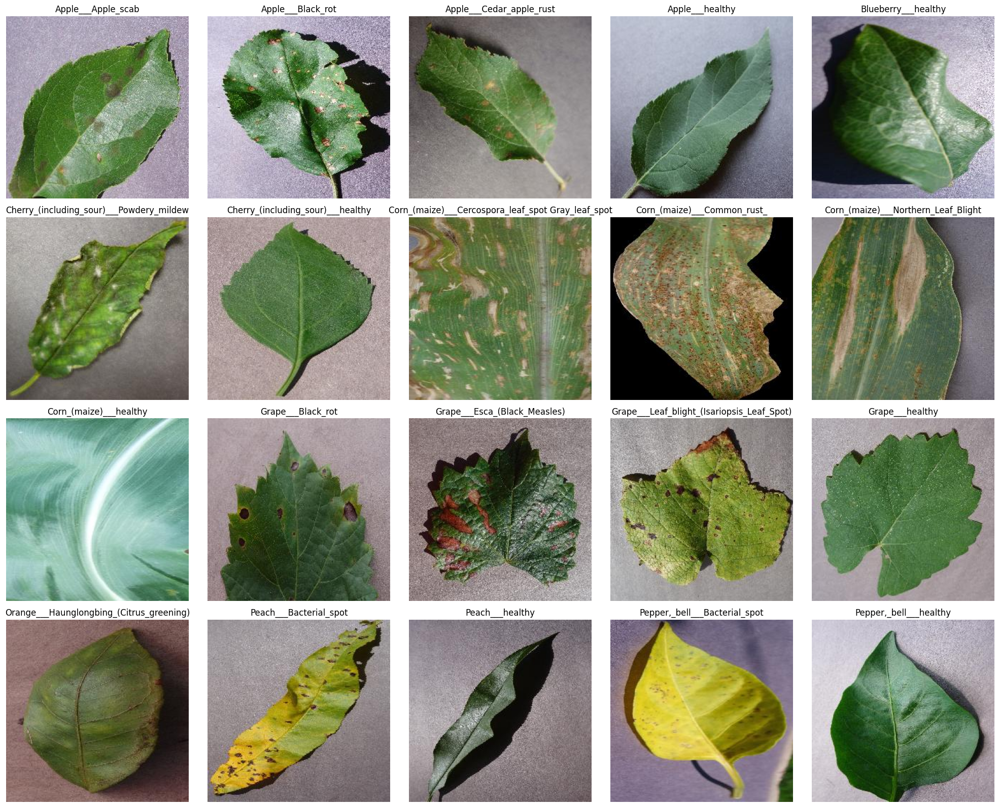

In [9]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt

# Define dataset path
color_path = "/content/drive/MyDrive/AI_535_final_project/plantvillagedataset/color/train"

# Get class names (subdirectories)
class_names = sorted([dirname for dirname in os.listdir(color_path) if os.path.isdir(os.path.join(color_path, dirname))])

# Use a valid Matplotlib style
plt.style.use('ggplot')

# Set figure size and number of images per row
num_classes_to_display = min(20, len(class_names))  # Display up to 20 classes for better readability
images_per_row = 5
rows = (num_classes_to_display // images_per_row) + (num_classes_to_display % images_per_row > 0)

plt.figure(figsize=(20, rows * 4))  # Adjust figure size dynamically

# Loop through each class and display one random image
for idx, class_name in enumerate(class_names[:num_classes_to_display]):
    class_dir = os.path.join(color_path, class_name)

    # List all valid image files
    image_files = [file for file in os.listdir(class_dir) if file.lower().endswith(('.png', '.jpg', 'jpeg'))]

    if not image_files:
        continue  # Skip if no images found in class folder

    # Select a random image
    random_image = random.choice(image_files)

    # Load image
    img_path = os.path.join(class_dir, random_image)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot image
    plt.subplot(rows, images_per_row, idx + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(class_name, fontsize=12)

plt.tight_layout()
plt.show()

In [10]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam

# Load Pretrained MobileNetV2 (excluding top layers)
base_model = tf.keras.applications.MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers (so we only train new layers)
base_model.trainable = False

# Add custom layers
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Convert feature maps to a single vector
x = Dense(1024, activation="relu")(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout to prevent overfitting
x = Dense(train_generator.num_classes, activation="softmax")(x)  # Output layer

# Define the model
model = Model(inputs=base_model.input, outputs=x)

# Compile with Adam optimizer
model.compile(
    optimizer=Adam(learning_rate=0.0001),  # 🔹 Adjust learning rate if needed
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Show model summary
model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 3,608,678 (13.77 MB)

 Trainable params: 1,350,694 (5.15 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [11]:
# Enable Mixed Precision Training (if using GPU)
tf.keras.mixed_precision.set_global_policy("mixed_float16")

In [12]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor="val_accuracy", patience=5, restore_best_weights=True)

# Save the best model based on validation accuracy
checkpoint_callback = ModelCheckpoint(
    "best_mobilenet_model.keras",
    save_best_only=True,
    monitor="val_accuracy",
    mode="max"
)

In [13]:
EPOCHS = 30

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=[early_stopping, checkpoint_callback]
)

print("Model training complete!")

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 608s 500ms/step - accuracy: 0.5842 - loss: 1.6032 - val_accuracy: 0.8834 - val_loss: 0.4175
Epoch 2/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 538s 453ms/step - accuracy: 0.8509 - loss: 0.4832 - val_accuracy: 0.9139 - val_loss: 0.2968
Epoch 3/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 534s 449ms/step - accuracy: 0.8841 - loss: 0.3757 - val_accuracy: 0.9198 - val_loss: 0.2636
Epoch 4/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 533s 449ms/step - accuracy: 0.9001 - loss: 0.3127 - val_accuracy: 0.9176 - val_loss: 0.2550
Epoch 5/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 539s 454ms/step - accuracy: 0.9074 - loss: 0.2876 - val_accuracy: 0.9261 - val_loss: 0.2297
Epoch 6/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 533s 449ms/step - accuracy: 0.9187 - loss: 0.2520 - val_accuracy: 0.9359 - val_loss: 0.1975
Epoch 7/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 532s 448ms/step - accuracy: 0.9240 - loss: 0.2320 - val_accuracy: 0.9406 - val_loss: 0.1900
Epoch 8/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 531s 447ms/step - ac

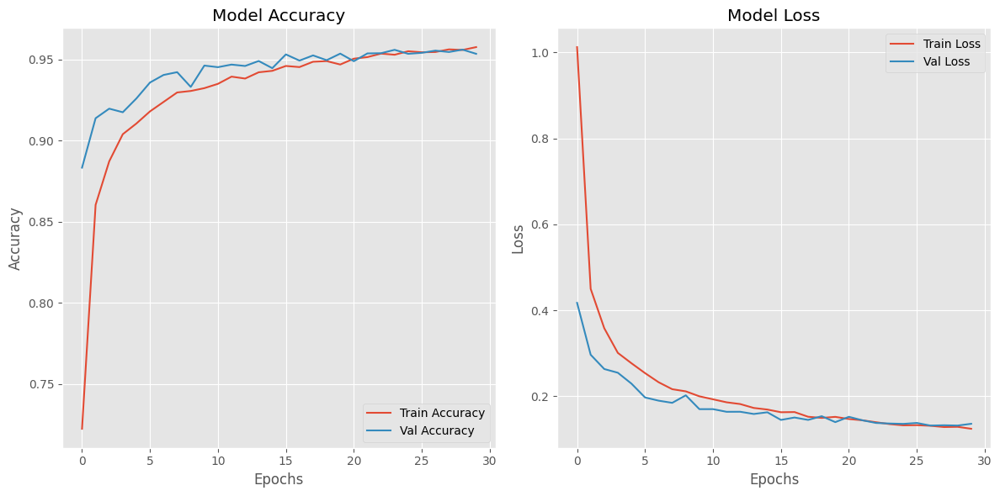

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert history to DataFrame
history_df = pd.DataFrame(history.history)

# Plot Accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history_df["accuracy"], label="Train Accuracy")
plt.plot(history_df["val_accuracy"], label="Val Accuracy")
plt.title("Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history_df["loss"], label="Train Loss")
plt.plot(history_df["val_loss"], label="Val Loss")
plt.title("Model Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [16]:
# Evaluate model on validation data
val_loss, val_accuracy = model.evaluate(val_generator)
print(f"Validation Accuracy: {val_accuracy:.2f}, Validation Loss: {val_loss:.2f}")

255/255 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - accuracy: 0.9541 - loss: 0.1393
Validation Accuracy: 0.96, Validation Loss: 0.13


In [17]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_generator)

print(f"\nTest Accuracy: {test_accuracy:.2%}")
print(f"Test Loss: {test_loss:.4f}")

256/256 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - accuracy: 0.9709 - loss: 0.0888

Test Accuracy: 95.78%
Test Loss: 0.1208


In [18]:
import numpy as np
from sklearn.metrics import classification_report

# Get true labels from the test generator
y_true = test_generator.classes  # True labels

# Get predicted labels
y_pred_probabilities = model.predict(test_generator)  # Get probabilities
y_pred = np.argmax(y_pred_probabilities, axis=1)  # Convert to class labels

# Get class names from generator
class_labels = list(test_generator.class_indices.keys())

# Print classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))

256/256 ━━━━━━━━━━━━━━━━━━━━ 31s 107ms/step

🔹 Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.99      0.97      0.98        95
                                 Apple___Black_rot       1.00      0.95      0.97        94
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        42
                                   Apple___healthy       0.96      0.98      0.97       248
                               Blueberry___healthy       1.00      0.97      0.98       226
          Cherry_(including_sour)___Powdery_mildew       0.98      0.99      0.98       159
                 Cherry_(including_sour)___healthy       0.99      0.98      0.99       129
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.91      0.76      0.83        78
                       Corn_(maize)___Common_rust_       0.99      1.00      1.00       180
         

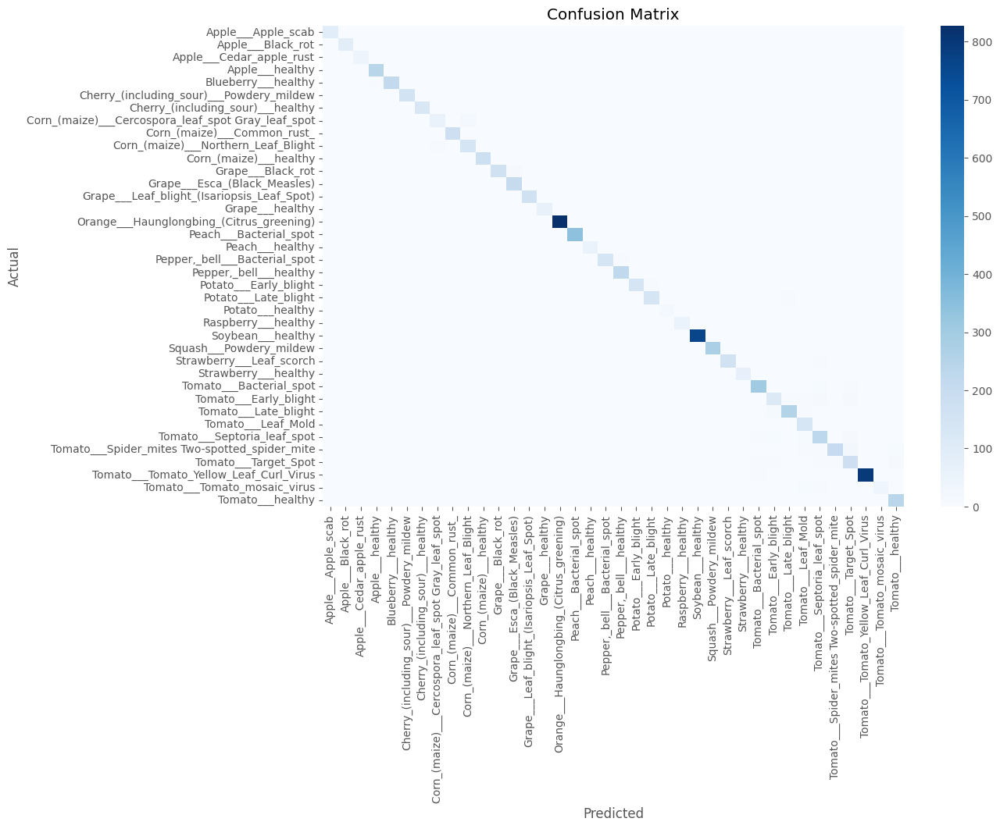

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=False, cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
from google.colab import output
import time

while True:
    # output.eval_js('google.colab.kernel.execute("print(\'Preventing disconnect\')")')
    time.sleep(60)  # Run every 60 seconds


In [21]:
import numpy as np
import os
import shutil

# Define a folder to store misclassified images
misclassified_folder = "/content/drive/MyDrive/AI_535_final_project/misclassified_images"
os.makedirs(misclassified_folder, exist_ok=True)

# Get true and predicted labels
y_true = test_generator.classes  # Actual labels from test set
y_pred_probabilities = model.predict(test_generator)  # Predicted probabilities
y_pred = np.argmax(y_pred_probabilities, axis=1)  # Convert probabilities to class labels
class_labels = list(test_generator.class_indices.keys())  # Class names

# Track misclassified images
misclassified_count = 0

# Loop through all test images
for i, (true_label, pred_label) in enumerate(zip(y_true, y_pred)):
    if true_label != pred_label:  # Check if misclassified
        img_filename = test_generator.filenames[i]  # Get image filename
        src_path = os.path.join(test_path, img_filename)  # Source path
        dest_path = os.path.join(misclassified_folder, os.path.basename(img_filename))  # Destination path

        # Copy misclassified image to new folder
        shutil.copy(src_path, dest_path)
        misclassified_count += 1

print(f"✅ Saved {misclassified_count} misclassified images in: {misclassified_folder}")


256/256 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step
✅ Saved 345 misclassified images in: /content/drive/MyDrive/AI_535_final_project/misclassified_images


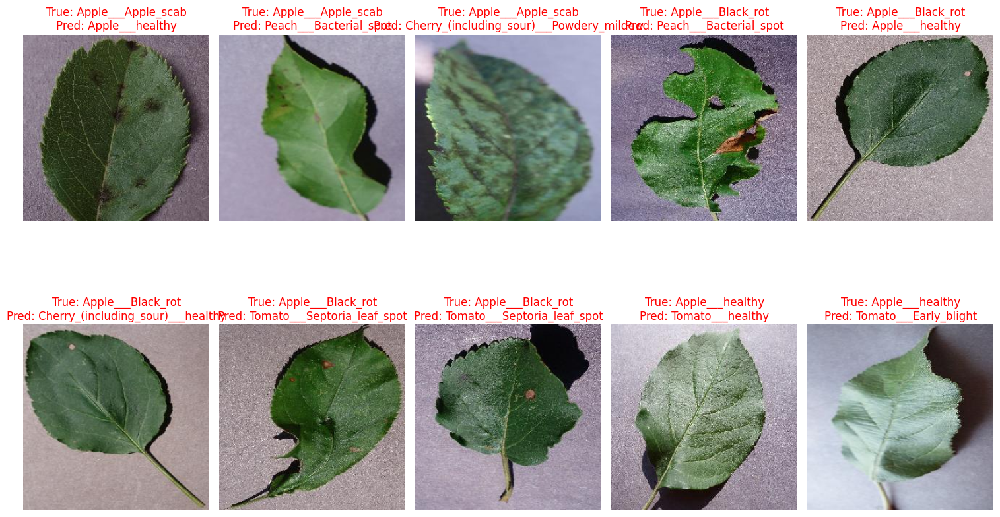

In [23]:
import cv2
import matplotlib.pyplot as plt

# Get a list of misclassified image files
misclassified_images = os.listdir(misclassified_folder)

# Limit to first 10 images for visualization
num_images = min(10, len(misclassified_images))

plt.figure(figsize=(15, 10))

for i, img_file in enumerate(misclassified_images[:num_images]):
    img_path = os.path.join(misclassified_folder, img_file)

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Find the correct index in test_generator.filenames by removing folder names
    test_filenames_clean = [os.path.basename(f) for f in test_generator.filenames]  # Remove directory paths
    if img_file in test_filenames_clean:
        img_index = test_filenames_clean.index(img_file)
        true_label = class_labels[y_true[img_index]]
        pred_label = class_labels[y_pred[img_index]]
    else:
        true_label = "Unknown"
        pred_label = "Unknown"

    # Plot image
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"True: {true_label}\nPred: {pred_label}", fontsize=12, color="red")

plt.tight_layout()
plt.show()

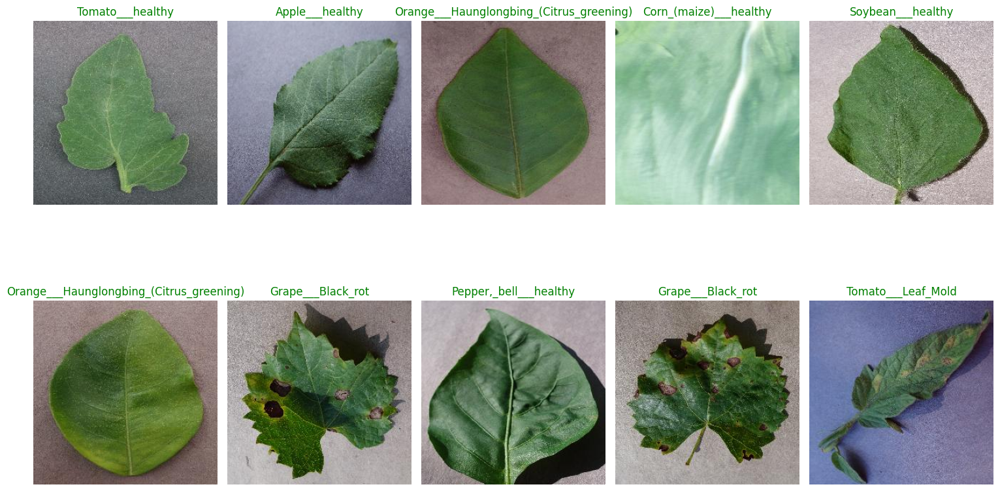

In [24]:
import random
import cv2
import matplotlib.pyplot as plt

# Find correctly classified images
correct_indices = [i for i in range(len(y_true)) if y_true[i] == y_pred[i]]
random.shuffle(correct_indices)  # Shuffle for variety

# Limit to first 10 images for visualization
num_images = min(10, len(correct_indices))

plt.figure(figsize=(15, 10))

for i, idx in enumerate(correct_indices[:num_images]):
    img_file = test_generator.filenames[idx]
    img_path = os.path.join(test_path, img_file)

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Get true label
    true_label = class_labels[y_true[idx]]

    # Plot image
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{true_label}", fontsize=12, color="green")

plt.tight_layout()
plt.show()

<ipython-input-26-0afb92631122>:30: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


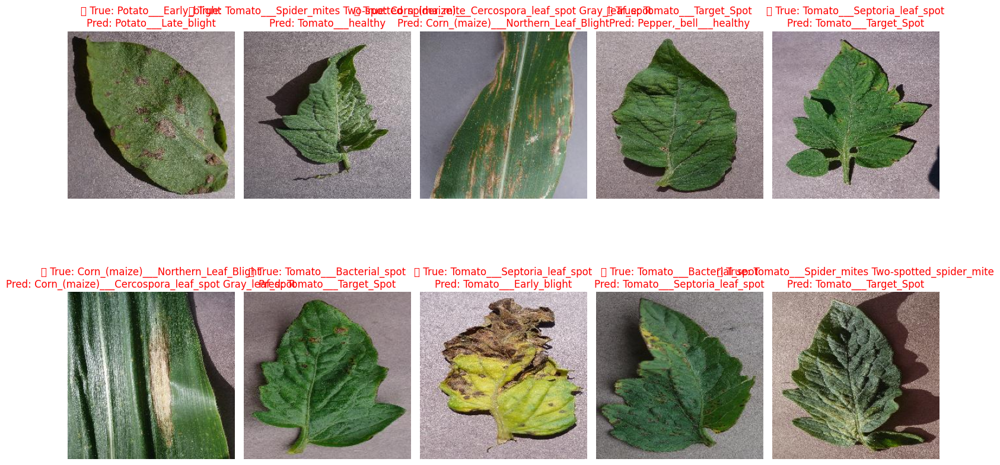

In [26]:
import random

# Shuffle misclassified indices
misclassified_indices = [i for i in range(len(y_true)) if y_true[i] != y_pred[i]]
random.shuffle(misclassified_indices)

# Limit to first 10 images for visualization
num_images = min(10, len(misclassified_indices))

plt.figure(figsize=(15, 10))

for i, idx in enumerate(misclassified_indices[:num_images]):
    img_file = test_generator.filenames[idx]
    img_path = os.path.join(test_path, img_file)

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Get true and predicted labels
    true_label = class_labels[y_true[idx]]
    pred_label = class_labels[y_pred[idx]]

    # Plot image
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"❌ True: {true_label}\nPred: {pred_label}", fontsize=12, color="red")

plt.tight_layout()
plt.show()